# AWS Bedrock LLM Essentials

In this notebook, we will cover the essentials of how to use the [`boto3` Python SDK](https://boto3.amazonaws.com/v1/documentation/api/latest/index.html) to work with [Amazon Bedrock](https://aws.amazon.com/bedrock/) Foundation and Fine-tuned LLMs.

## Install necessary dependencies

Run the cells in this section to install the packages needed by the notebooks in this session. 
⚠️ You will see pip dependency errors, you can safely ignore these errors. ⚠️

IGNORE ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.

In [1]:
!pip install --no-build-isolation --force-reinstall \
    "boto3>=1.28.57" \
    "awscli>=1.29.57" \
    "botocore>=1.31.57"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 64.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 94.3 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.2/548.2 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 51.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.2/82.2 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.1/121.1 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 4.5 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.26.18
    Uninstalling urllib3-1.26.18:
      Successfully uninstalled urllib3-1.26.18
  Attempting uninstall: six
    Found existing installation: six 1.16.0
    Uninstalling six-1.16.0:
   

## Load Dependencies

In [2]:
import json
import os
import sys
import boto3

## Create the Boto3 AWS Bedrock client

Interaction with the Bedrock API is done via the AWS SDK for Python: [boto3](https://boto3.amazonaws.com/v1/documentation/api/latest/index.html).

#### Use different clients

The boto3 provides different clients for Amazon Bedrock to perform different actions. The actions for [`InvokeModel`](https://docs.aws.amazon.com/bedrock/latest/APIReference/API_runtime_InvokeModel.html) and [`InvokeModelWithResponseStream`](https://docs.aws.amazon.com/bedrock/latest/APIReference/API_runtime_InvokeModelWithResponseStream.html) are supported by Amazon Bedrock Runtime where as other operations, such as [ListFoundationModels](https://docs.aws.amazon.com/bedrock/latest/APIReference/API_ListFoundationModels.html), are handled via [Amazon Bedrock client](https://docs.aws.amazon.com/bedrock/latest/APIReference/API_Operations_Amazon_Bedrock.html).


#### Use the default credential chain

If you are running this notebook from [Amazon Sagemaker Studio](https://aws.amazon.com/sagemaker/studio/) and your Sagemaker Studio [execution role](https://docs.aws.amazon.com/sagemaker/latest/dg/sagemaker-roles.html) has permissions to access Bedrock you can just run the cells below as-is. This is also the case if you are running these notebooks from a computer whose default AWS credentials have access to Bedrock.

In [3]:
boto3_bedrock = boto3.client('bedrock')

## List Available Foundation and Fine-tuned Models

We can check the client works by trying out the `list_foundation_models()` method, which will tell us all the models available for us to use 

In [4]:
boto3_bedrock.list_foundation_models()

{'ResponseMetadata': {'RequestId': '5424e8ac-c911-45c4-8130-0642c9809b56',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'date': 'Sun, 21 Apr 2024 00:06:06 GMT',
   'content-type': 'application/json',
   'content-length': '21593',
   'connection': 'keep-alive',
   'x-amzn-requestid': '5424e8ac-c911-45c4-8130-0642c9809b56'},
  'RetryAttempts': 0},
 'modelSummaries': [{'modelArn': 'arn:aws:bedrock:us-west-2::foundation-model/amazon.titan-tg1-large',
   'modelId': 'amazon.titan-tg1-large',
   'modelName': 'Titan Text Large',
   'providerName': 'Amazon',
   'inputModalities': ['TEXT'],
   'outputModalities': ['TEXT'],
   'responseStreamingSupported': True,
   'customizationsSupported': [],
   'inferenceTypesSupported': ['ON_DEMAND'],
   'modelLifecycle': {'status': 'ACTIVE'}},
  {'modelArn': 'arn:aws:bedrock:us-west-2::foundation-model/amazon.titan-embed-g1-text-02',
   'modelId': 'amazon.titan-embed-g1-text-02',
   'modelName': 'Titan Text Embeddings v2',
   'providerName': 'Amazon',
   'inp

## Understanding how to call LLMs for generation

### `InvokeModel` body and output

The `invoke_model()` method of the Amazon Bedrock runtime client (`InvokeModel` API) will be the primary method we use for most of our Text Generation and Processing tasks - whichever model we're using.

Although the method is shared, the format of input and output varies depending on the foundation model used - as described for some of the popular LLMs:

#### Amazon Titan Large

##### Input
```json
{   
    "inputText": "<prompt>",
    "textGenerationConfig" : { 
        "maxTokenCount": 512,
        "stopSequences": [],
        "temperature": 0.1,  
        "topP": 0.9
    }
}
```

##### Output

```json
{
    "inputTextTokenCount": 613,
    "results": [{
        "tokenCount": 219,
        "outputText": "<output>"
    }]
}
```

#### Anthropic Claude

##### Input

```json
{
    "prompt": "\n\nHuman:<prompt>\n\nAnswer:",
    "max_tokens_to_sample": 300,
    "temperature": 0.5,
    "top_k": 250,
    "top_p": 1,
    "stop_sequences": ["\n\nHuman:"]
}
```

##### Output

```json
{
    "completion": "<output>",
    "stop_reason": "stop_sequence"
}
```

#### Stability AI Stable Diffusion XL

##### Input

```json
{
    "text_prompts": [
        {"text": "this is where you place your input text"}
    ],
    "cfg_scale": 10,
    "seed": 0,
    "steps": 50
}
```

##### Output

```json
{ 
    "result": "success", 
    "artifacts": [
        {
            "seed": 123, 
            "base64": "<image in base64>",
            "finishReason": "SUCCESS"
        },
        //...
    ]
}
```

### Common inference parameter definitions

#### Randomness and Diversity

Foundation models generally support the following parameters to control randomness and diversity in the 
response.

**Temperature** – Large language models use probability to construct the words in a sequence. For any 
given next word, there is a probability distribution of options for the next word in the sequence. When 
you set the temperature closer to zero, the model tends to select the higher-probability words. When 
you set the temperature further away from zero, the model may select a lower-probability word.

In technical terms, the temperature modulates the probability density function for the next tokens, 
implementing the temperature sampling technique. This parameter can deepen or flatten the density 
function curve. A lower value results in a steeper curve with more deterministic responses, and a higher 
value results in a flatter curve with more random responses.

**Top K** – Temperature defines the probability distribution of potential words, and Top K defines the cut 
off where the model no longer selects the words. For example, if K=50, the model selects from 50 of the 
most probable words that could be next in a given sequence. This reduces the probability that an unusual 
word gets selected next in a sequence.
In technical terms, Top K is the number of the highest-probability vocabulary tokens to keep for Top-
K-filtering - This limits the distribution of probable tokens, so the model chooses one of the highest-
probability tokens.

**Top P** – Top P defines a cut off based on the sum of probabilities of the potential choices. If you set Top 
P below 1.0, the model considers the most probable options and ignores less probable ones. Top P is 
similar to Top K, but instead of capping the number of choices, it caps choices based on the sum of their 
probabilities.
For the example prompt "I hear the hoof beats of ," you may want the model to provide "horses," 
"zebras" or "unicorns" as the next word. If you set the temperature to its maximum, without capping 
Top K or Top P, you increase the probability of getting unusual results such as "unicorns." If you set the 
temperature to 0, you increase the probability of "horses." If you set a high temperature and set Top K or 
Top P to the maximum, you increase the probability of "horses" or "zebras," and decrease the probability 
of "unicorns."

#### Length

The following parameters control the length of the generated response.

**Response length** – Configures the minimum and maximum number of tokens to use in the generated 
response.

**Length penalty** – Length penalty optimizes the model to be more concise in its output by penalizing 
longer responses. Length penalty differs from response length as the response length is a hard cut off for 
the minimum or maximum response length.

In technical terms, the length penalty penalizes the model exponentially for lengthy responses. 0.0 
means no penalty. Set a value less than 0.0 for the model to generate longer sequences, or set a value 
greater than 0.0 for the model to produce shorter sequences.

#### Repetitions

The following parameters help control repetition in the generated response.

**Repetition penalty (presence penalty)** – Prevents repetitions of the same words (tokens) in responses. 
1.0 means no penalty. Greater than 1.0 decreases repetition.

## Connect to AWS Bedrock Runtime

Runtime is used to connect to existing foundation and fine-tuned LLMs for inference

In [5]:
import boto3
import botocore
import json 

In [6]:
bedrock_runtime = boto3.client('bedrock-runtime')

## Amazon Titan Text models

For more information on Titan Text prompt engineering guidelines, see [Titan Text Prompt Engineering Guidelines](https://d2eo22ngex1n9g.cloudfront.net/Documentation/User+Guides/Titan/Amazon+Titan+Text+Prompt+Engineering+Guidelines.pdf).

For more information on Titan models, see Amazon [Titan Models](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-models.html).

### Prompt Amazon Titan Text LLMs 

Let's use the basic `invoke_model(...)`function to do some prompting with the titan text LLMs

In [33]:
def prompt_amazon_titan_model_text(prompt, model_id):
    body = json.dumps({
            "inputText": prompt,
            "textGenerationConfig": {
                "temperature": 0,
                "maxTokenCount": 8000
            }
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model(body=body, modelId=model_id, 
                                            accept=accept, contentType=content_type)
    response_body = json.loads(response.get("body").read())
    return response_body

In [34]:
model_id = 'amazon.titan-text-express-v1'
prompt = """Give a detailed analysis of pros and cons (3 points each) of commercial real estate investing with examples"""
response = prompt_amazon_titan_model_text(prompt=prompt, model_id=model_id)

In [35]:
response

{'inputTextTokenCount': 20,
 'results': [{'tokenCount': 367,
   'outputText': '\nCommercial real estate investing can be a lucrative way to build wealth over time, but it also comes with its own set of pros and cons. Here are some of the key points to consider:\n\nPros:\n1. High Potential Returns: Commercial real estate investments can offer higher returns than residential properties, particularly in areas with strong economic growth and high demand for rental properties.\n2. Long-Term Stability: Commercial properties tend to be more stable than residential properties, as businesses typically have a longer lifespan and are less susceptible to economic downturns.\n3. Diversification: Commercial real estate investments can help diversify your portfolio, reducing risk and providing exposure to different asset classes.\n\nCons:\n1. High Initial Investment: Commercial real estate investments typically require a significant initial investment, including down payment, closing costs, and ongoi

In [36]:
print(response['results'][0]['outputText'])


Commercial real estate investing can be a lucrative way to build wealth over time, but it also comes with its own set of pros and cons. Here are some of the key points to consider:

Pros:
1. High Potential Returns: Commercial real estate investments can offer higher returns than residential properties, particularly in areas with strong economic growth and high demand for rental properties.
2. Long-Term Stability: Commercial properties tend to be more stable than residential properties, as businesses typically have a longer lifespan and are less susceptible to economic downturns.
3. Diversification: Commercial real estate investments can help diversify your portfolio, reducing risk and providing exposure to different asset classes.

Cons:
1. High Initial Investment: Commercial real estate investments typically require a significant initial investment, including down payment, closing costs, and ongoing maintenance expenses.
2. Management Challenges: Managing commercial properties can be

In [37]:
model_id = 'amazon.titan-tg1-large'
response = prompt_amazon_titan_model_text(prompt=prompt, model_id=model_id)
print(response['results'][0]['outputText'])


Commercial real estate investing can be a lucrative way to build wealth over time, but it also comes with its own set of pros and cons. Here are some of the key points to consider:

Pros:
1. High Potential Returns: Commercial real estate investments can offer higher returns than residential properties, particularly in areas with strong economic growth and high demand for rental properties.
2. Long-Term Stability: Commercial properties tend to be more stable than residential properties, as businesses typically have a longer lifespan and are less susceptible to economic downturns.
3. Diversification: Commercial real estate investments can help diversify your portfolio, reducing risk and providing exposure to different asset classes and markets.

Cons:
1. High Initial Investment: Commercial real estate investments typically require a significant initial investment, including down payment, closing costs, and ongoing maintenance expenses.
2. Management Challenges: Commercial properties req

### Prompt Amazon Titan Text LLMs with streaming output

For LLMs, it can take noticeable time to generate long output sequences. Rather than waiting for the entire response to be available, latency-sensitive applications may like to **stream** the response to users.

Run the code below to see how you can achieve this with Bedrock's `invoke_model_with_response_stream()` method - returning the response body in separate chunks.

In [63]:
def prompt_amazon_titan_model_text_stream(prompt, model_id):
    body = json.dumps({
            "inputText": prompt,
            "textGenerationConfig": {
                "temperature": 0,
                "maxTokenCount": 8000
            }
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model_with_response_stream(body=body, modelId=model_id, 
                                            accept=accept, contentType=content_type)
    stream = response.get('body')
    output = []
    if stream:
        for event in stream:
            chunk = event.get('chunk')
            if chunk:
                chunk_obj = json.loads(chunk.get('bytes').decode())
                if 'outputText' in chunk_obj:
                    text = chunk_obj.get('outputText', None)
                    print(text, end='')
                    if not text:
                        break
                    output.append(text)
    return output

In [64]:
model_id = 'amazon.titan-text-express-v1'
prompt = """Give a detailed analysis of pros and cons (3 points each) of commercial real estate investing with examples"""
response = prompt_amazon_titan_model_text_stream(prompt=prompt, model_id=model_id)


Commercial real estate investing can be a lucrative way to build wealth over time, but it also comes with its own set of pros and cons. Here are some of the key points to consider:

Pros:

High Potential Returns: Commercial real estate investments have the potential to generate high returns compared to other asset classes. This is due to the rental income generated by tenants, as well as the potential for property value appreciation.

Stability: Commercial real estate properties are typically less volatile than residential properties, which can be affected by market fluctuations and economic downturns. This stability can provide peace of mind for investors.

Diversification: Commercial real estate investments can be diversified across different asset types, such as office buildings, retail spaces, hotels, and warehouses. This diversification can help reduce risk and provide a more balanced portfolio.

Tax Benefits: Commercial real estate investments can offer tax benefits, such as dep

In [70]:
response

['\nCommercial real estate investing can be a lucrative way to build wealth over time, but it also comes with its own set of pros and cons. Here are some of the key points to consider:\n\nPros:\n\nHigh Potential Returns:',
 ' Commercial real estate investments have the potential to generate high returns compared to other asset classes. This is due to the rental income generated by tenants, as well as the potential for property value appreciation.\n\nStability: Commercial real estate properties are typically less volatile than residential properties, which can be affected by market fluctuations and economic',
 ' downturns. This stability can provide peace of mind for investors.\n\nDiversification: Commercial real estate investments can be diversified across different asset types, such as office buildings, retail spaces, hotels, and warehouses. This diversification can help reduce risk and provide a more balanced portfolio.\n\nTax Benefits: Commercial real estat',
 'e investments can off

In [69]:
print(''.join([item for item in response]))


Commercial real estate investing can be a lucrative way to build wealth over time, but it also comes with its own set of pros and cons. Here are some of the key points to consider:

Pros:

High Potential Returns: Commercial real estate investments have the potential to generate high returns compared to other asset classes. This is due to the rental income generated by tenants, as well as the potential for property value appreciation.

Stability: Commercial real estate properties are typically less volatile than residential properties, which can be affected by market fluctuations and economic downturns. This stability can provide peace of mind for investors.

Diversification: Commercial real estate investments can be diversified across different asset types, such as office buildings, retail spaces, hotels, and warehouses. This diversification can help reduce risk and provide a more balanced portfolio.

Tax Benefits: Commercial real estate investments can offer tax benefits, such as dep

## Amazon Titan LLM Text Embeddings 

Use text embeddings to convert text into meaningful vector representations. You input a body of text 
and the output is a (1 x n) vector. You can use embedding vectors for a wide variety of applications. 
Bedrock currently offers Titan Embeddings for text embedding that supports text similarity (finding the 
semantic similarity between bodies of text) and text retrieval (such as search).

At the time of writing you can use `amazon.titan-embed-text-v1` as embedding model via the API. 
The input text size is 8192 tokens and the output embedding vector length is 1536.

To use a text embeddings model, use the InvokeModel API operation or the Python SDK.
Use InvokeModel to retrieve the vector representation of the input text from the specified model.



#### Input

```json
{
    "inputText": "<text>"
}
```

#### Output

```json
{
    "embedding": []
}
```


In [74]:
def generate_amazon_titan_embedding(text, model_id):
    body = json.dumps({
            "inputText": text
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model(body=body, modelId=model_id, 
                                            accept=accept, contentType=content_type)
    response_body = json.loads(response.get("body").read())
    return response_body.get("embedding")

In [83]:
docs = [
    'cats love sleeping',
    'dogs love to eat',
    'cars are fast to drive'
]

model_id = 'amazon.titan-embed-text-v1'

In [84]:
emb = generate_amazon_titan_embedding(text=docs[0], model_id=model_id)

In [85]:
print(len(emb))

1536


In [86]:
from sklearn.metrics.pairwise import cosine_similarity

embeddings = [generate_amazon_titan_embedding(text=doc, model_id=model_id) for doc in docs]

In [87]:
cosine_similarity(embeddings)

array([[1.        , 0.36600404, 0.13340686],
       [0.36600404, 1.        , 0.15826941],
       [0.13340686, 0.15826941, 1.        ]])

## Amazon Titan Multimodal Embeddings G1 Generation 1 (G1)

Amazon Titan Multimodal Embeddings G1 Generation 1 (G1) is a multimodal embeddings model designed for use cases like searching images by text, image, or a combination of text and image. This model is optimized for high accuracy and fast responses, making it an ideal choice for search and recommendations use cases.


#### Specifications

- **Model ID:** amazon.titan-embed-image-v1
- **Max Input Text Tokens:** 128
- **Languages Supported:** English
- **Max Input Image Size:** 5 MB
- **Output Vector Size:** 1,024 (default), 384, 256
- **Inference Types:** On-Demand, Provisioned Throughput
- **Supported Use Cases:** Image search, recommendations, and personalization



#### Embedding Length

Setting a custom embedding length is optional. The default embedding length is 1024 characters, which suits most use cases. However, you can set the embedding length to 256, 384, or 1024 characters. Larger embedding sizes create more detailed responses but also increase computational time. Shorter embedding lengths are less detailed but improve the response time.

#### EmbeddingConfig Shape

```json
{
  "outputEmbeddingLength": "int // Optional, One of: [256, 384, 1024], default: 1024"
}
```
#### Updated API Payload Example

```json
{
  "inputText": "hi",
  "inputImage": "image_string",
  "embeddingConfig": {
    "outputEmbeddingLength": 256
  }
}
```


### Get some images and captions

In [103]:
!curl -o cat.png 'https://i.imgur.com/vdqx3Cm.png'
!curl -o dog.png 'https://i.imgur.com/vxXzVtL.png'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1278k  100 1278k    0     0  3505k      0 --:--:-- --:--:-- --:--:-- 3511k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1526k  100 1526k    0     0  4099k      0 --:--:-- --:--:-- --:--:-- 4093k


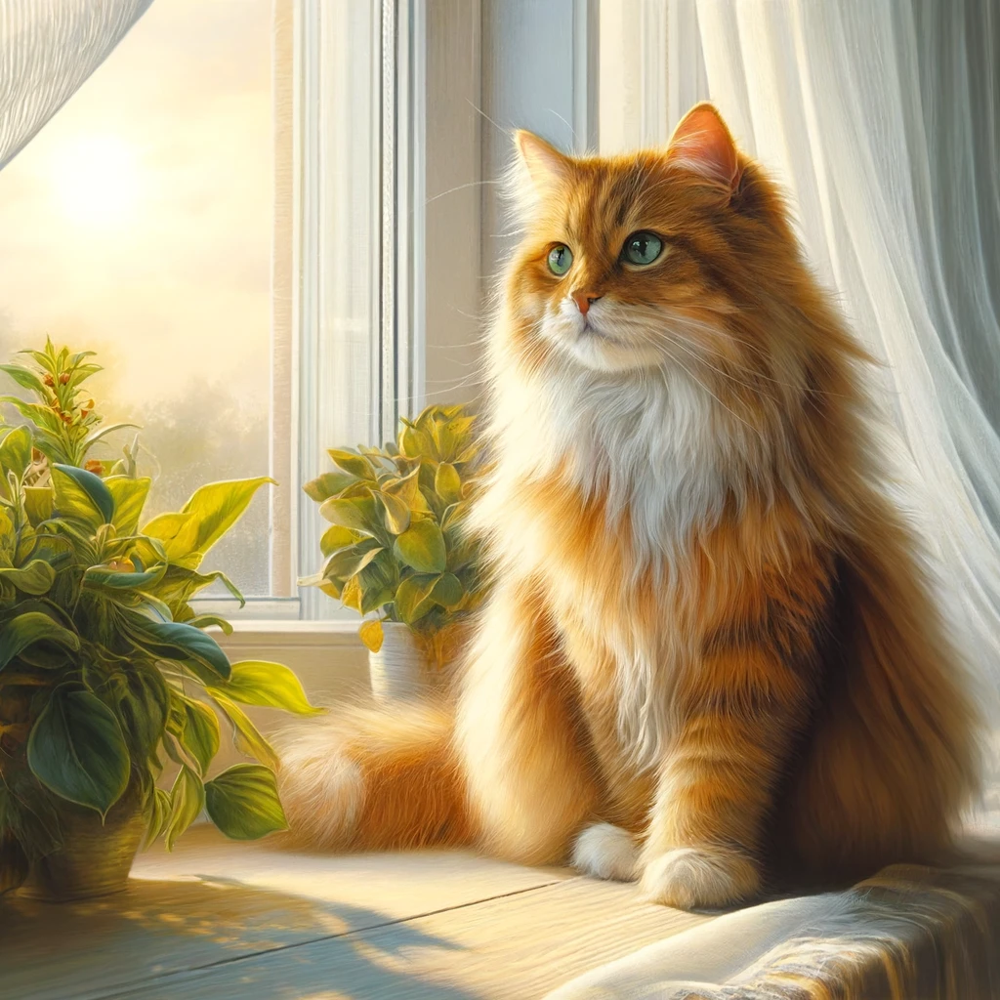

In [105]:
from PIL import Image

img = Image.open("cat.png")
img

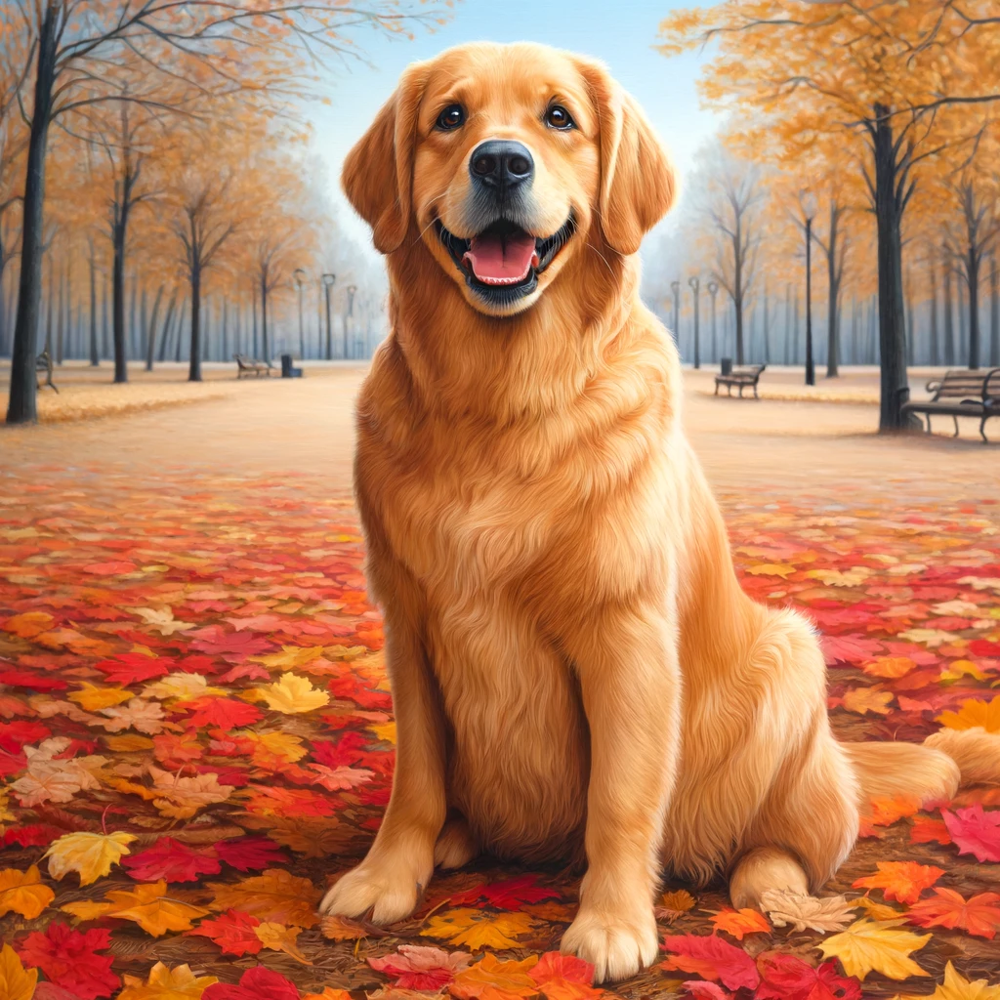

In [106]:
img = Image.open("dog.png")
img

In [109]:
descriptions = [
    "a fluffy, ginger tabby cat sitting on a windowsill",
    "a cheerful golden retriever sitting in an autumnal park"
]

### Text Only Embeddings

This example shows how to call the Amazon Titan Multimodal Embeddings G1 model to generate text embeddings.

In [113]:
def generate_text_embeddings(input_text, model_id):
    """
    Generate a vector of embeddings for a text input using Amazon Titan Multimodal Embeddings G1 on demand.
    Args:
        model_id (str): The model ID to use.
        body (str) : The request body to use.
    Returns:
        response (JSON): The embeddings that the model generated, token information, and the
        reason the model stopped generating embeddings.
    """
    # Create request body.
    body = json.dumps({
        "inputText": input_text,
        "embeddingConfig": {
            "outputEmbeddingLength": 1024 # 256 | 384 | 1024
        }
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model(
        body=body, modelId=model_id, accept=accept, contentType=content_type
    )
    response_body = json.loads(response.get('body').read())
    return response_body.get('embedding')

In [114]:
model_id = "amazon.titan-embed-image-v1"
embs = [generate_text_embeddings(doc, model_id) for doc in descriptions]

In [115]:
cosine_similarity(embs)

array([[1.        , 0.49536597],
       [0.49536597, 1.        ]])

### Image Only Embeddings

This example shows how to call the Amazon Titan Multimodal Embeddings G1 model to generate image embeddings.

In [118]:
import base64

def generate_image_embeddings(input_image_path, model_id):
    """
    Generate a vector of embeddings for a text input using Amazon Titan Multimodal Embeddings G1 on demand.
    Args:
        model_id (str): The model ID to use.
        body (str) : The request body to use.
    Returns:
        response (JSON): The embeddings that the model generated, token information, and the
        reason the model stopped generating embeddings.
    """
    with open(input_image_path, "rb") as image_file:
        input_image = base64.b64encode(image_file.read()).decode('utf8')
    # Create request body.
    body = json.dumps({
        "inputImage": input_image,
        "embeddingConfig": {
            "outputEmbeddingLength": 1024 # 256 | 384 | 1024
        }
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model(
        body=body, modelId=model_id, accept=accept, contentType=content_type
    )
    response_body = json.loads(response.get('body').read())
    return response_body.get('embedding')

In [119]:
files = ['./cat.png', './dog.png'] 
model_id = "amazon.titan-embed-image-v1"
embs = [generate_image_embeddings(file_path, model_id) for file_path in files]

In [120]:
cosine_similarity(embs)

array([[1.        , 0.61318474],
       [0.61318474, 1.        ]])

### Multimodal Embeddings

This example shows how to call the Amazon Titan Multimodal Embeddings G1 model to generate embeddings from a combined text and image input. The resulting vector is the average of the generated text embeddings vector and the image embeddings vector.

In [121]:
import base64

def generate_multimodal_embeddings(input_text, input_image_path, model_id):
    """
    Generate a vector of embeddings for a text input using Amazon Titan Multimodal Embeddings G1 on demand.
    Args:
        model_id (str): The model ID to use.
        body (str) : The request body to use.
    Returns:
        response (JSON): The embeddings that the model generated, token information, and the
        reason the model stopped generating embeddings.
    """
    with open(input_image_path, "rb") as image_file:
        input_image = base64.b64encode(image_file.read()).decode('utf8')
    # Create request body.
    body = json.dumps({
        "inputText": input_text,
        "inputImage": input_image,
        "embeddingConfig": {
            "outputEmbeddingLength": 1024 # 256 | 384 | 1024
        }
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model(
        body=body, modelId=model_id, accept=accept, contentType=content_type
    )
    response_body = json.loads(response.get('body').read())
    return response_body.get('embedding')

In [122]:
descriptions = [
    "a fluffy, ginger tabby cat sitting on a windowsill",
    "a cheerful golden retriever sitting in an autumnal park"
]
files = ['./cat.png', './dog.png'] 
model_id = "amazon.titan-embed-image-v1"
embs = [generate_multimodal_embeddings(desc, image_file_path, model_id) 
            for desc, image_file_path in zip(descriptions, files)]

In [123]:
cosine_similarity(embs)

array([[1.        , 0.54096122],
       [0.54096122, 1.        ]])

## Amazon Titan Image Generator G1 Model

The **Amazon Titan Image Generator G1** is an advanced image generation model. It generates images from text and allows users to upload and edit an existing image. The model supports a variety of editing features including text prompt edits without a mask, and detailed image part edits with an image mask. It also enables image boundary extensions through outpainting and detailed edits within an image via inpainting. The model can generate variations of an image based on an optional text prompt and includes watermarking on the output files.

#### Note

Amazon Titan Image Generator G1 is currently in preview release and is not recommended for production work. Some features may not perform as expected and the accuracy of images and output data might be less reliable.

For more details on prompt engineering for this model, refer to the **Amazon Titan Image Generator G1 Prompt Engineering Best Practices**.

#### Specifications

- **Model ID:** amazon.titan-image-generator-v1
- **Max Input Characters:** 1,024 characters
- **Max Input Image Size:** 50 MB (only specific resolutions supported)
- **Max Image Size for In/Outpainting:** 1,024 x 1,024 px
- **Max Image Size for Image Variation:** 4,096 x 4,096 px
- **Languages Supported:** English
- **Output Type:** Image
- **Supported Image Types:** JPEG, JPG, PNG
- **Inference Types:** On-Demand, Provisioned Throughput
- **Supported Use Cases:** Image generation, image editing, image variations

### Features

#### Text-to-Image (T2I) Generation
Input a text prompt and generate a new image as output. The generated image captures the concepts described by the text prompt.

#### Finetuning of a T2I Model
Import several images to capture your own style and personalization, then fine-tune the core T2I model. The fine-tuned model generates images that follow the style and personalization of a specific user.

#### Image Editing Options
Includes inpainting, outpainting, generating variations, and automatic editing without an image mask.

#### Inpainting
Uses an image and a segmentation mask as input (either provided by the user or estimated by the model) and reconstructs the region within the mask.

#### Outpainting
Uses an image and a segmentation mask as input and generates new pixels that seamlessly extend the region.

#### Image Variation
Uses an image and an optional prompt as input. It generates a new image that preserves the content of the input image but variates its style and background.


### Prompt Engineering Guidelines

#### Mask Prompt
This algorithm classifies pixels into concepts based on a text prompt provided by the user. The prompt is used to classify areas of the image to be masked, interpreting complex prompts and encoding the mask into the segmentation algorithm.

#### Image Mask
An image mask can also be used to set mask values, enhancing accuracy when combined with a prompt input. The following parameters must be adhered to:

- **Mask Image Values:** Must be 0 (black) or 255 (white). Areas valued at 0 will be regenerated using the user prompt and/or input image.
- **MaskImage Field:** Must be a base64 encoded image string.
- **Mask Image Dimensions:** Must match the dimensions of the input image (same height and width).
- **File Types:** Only PNG or JPG files can be used for both the input and the mask image.
- **Color Values:** The mask image must only use black and white pixel values.
- **Channels:** Mask image can only use the RGB channels; alpha channel is not supported.

#### Additional Resources

For more information on Amazon Titan Image Generator G1 prompt engineering, refer to the [Amazon Titan Image Generator G1 Prompt Engineering Best Practices](https://d2eo22ngex1n9g.cloudfront.net/Documentation/User+Guides/Titan/Amazon+Titan+Image+Generator+Prompt+Engineering+Guidelines.pdf).

For a general overview of prompt engineering, see the [Prompt Engineering Guidelines](https://docs.aws.amazon.com/bedrock/latest/userguide/prompt-engineering-guidelines.html).


In [127]:
def generate_image(prompt, model_id):
    """
    Generate an image using Amazon Titan Image Generator G1 model on demand.
    Args:
        model_id (str): The model ID to use.
        body (str) : The request body to use.
    Returns:
        image_bytes (bytes): The image generated by the model.
    """

    body = json.dumps({
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt
        },
        "imageGenerationConfig": {
            "numberOfImages": 1,
            "height": 1024,
            "width": 1024,
            # CFG scale (classifier-free guidance scale) or guidance scale is a parameter that controls 
            # how much the image generation process follows the text prompt. 
            # The higher the value, the more the image sticks to a given text input
            "cfgScale": 8.0, 
            "seed": 0
        }
    })

    accept = "application/json"
    content_type = "application/json"

    response = bedrock_runtime.invoke_model(
        body=body, modelId=model_id, accept=accept, contentType=content_type
    )
    response_body = json.loads(response.get("body").read())
    base64_image = response_body.get("images")[0]
    base64_bytes = base64_image.encode('ascii')
    image_bytes = base64.b64decode(base64_bytes)
    return image_bytes

In [128]:
model_id = "amazon.titan-image-generator-v1"
prompt = "two dogs running on the beach"
img = generate_image(prompt, model_id)

In [133]:
type(img)

bytes

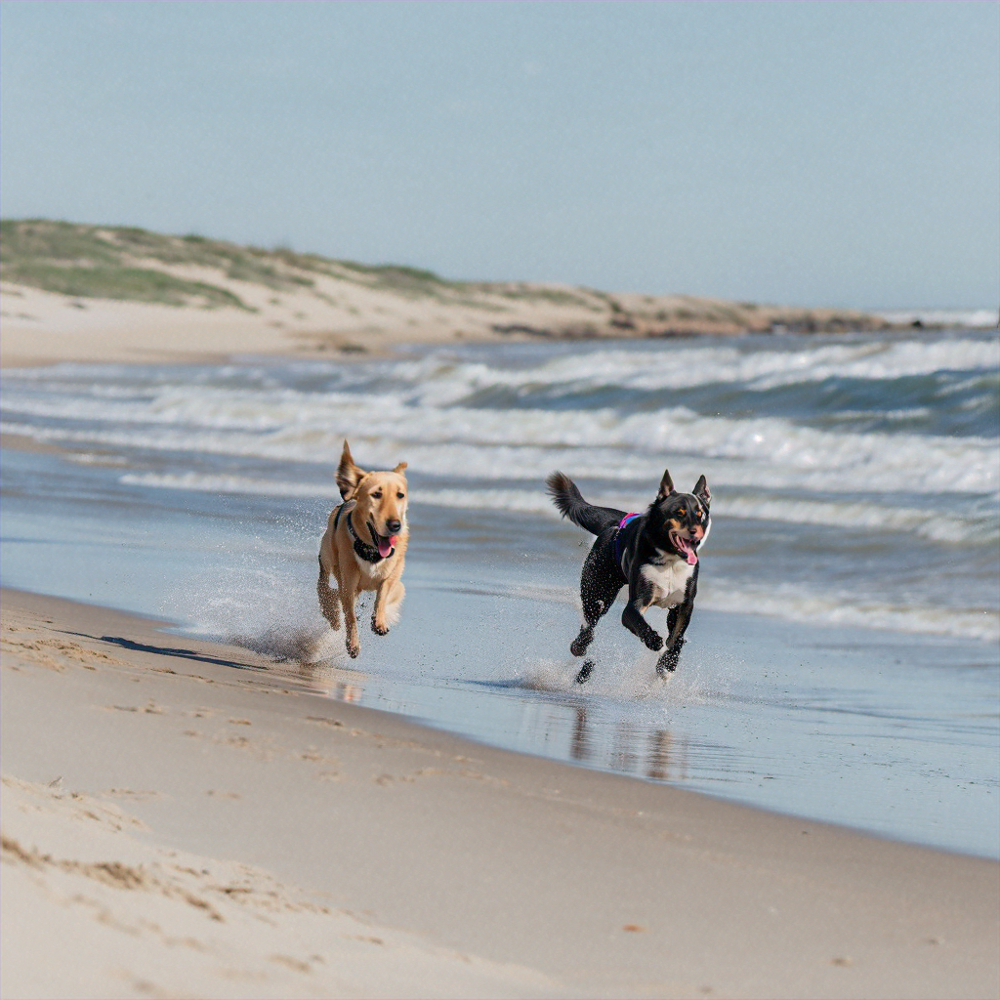

In [134]:
import io

img_stream = io.BytesIO(img)
img = Image.open(img_stream)
img

In [135]:
type(img)

PIL.PngImagePlugin.PngImageFile

In [136]:
img.save('dogs_beach.png')

In [146]:
import base64

def generate_image_inpaint(img_path, instruction_prompt, mask_prompt, model_id):
    """
    Shows how to use inpainting to generate an image from a source image with 
    the Amazon Titan Image Generator G1 model (on demand).
    The example uses a mask prompt to specify the area to inpaint.
    Args:
        model_id (str): The model ID to use.
        body (str) : The request body to use.
    Returns:
        image_bytes (bytes): The image generated by the model.
    """

    with open(img_path, "rb") as image_file:
            input_image = base64.b64encode(image_file.read()).decode('utf8')

    body = json.dumps({
            "taskType": "INPAINTING",  # can also do outpainting similarity - focused more on modifying or extending image background, elements etc
            "inPaintingParams": {
                "text": instruction_prompt,
                "negativeText": "bad quality, low res", # make image not follow these settings and do the opposite
                "image": input_image,
                "maskPrompt": mask_prompt
            },
            "imageGenerationConfig": {
                "numberOfImages": 1,
                "height": 1024,
                "width": 1024,
                "cfgScale": 8.0,
                "seed": 0
            }
    })

    accept = "application/json"
    content_type = "application/json"

    response = bedrock_runtime.invoke_model(
        body=body, modelId=model_id, accept=accept, contentType=content_type
    )
    response_body = json.loads(response.get("body").read())
    base64_image = response_body.get("images")[0]
    base64_bytes = base64_image.encode('ascii')
    image_bytes = base64.b64decode(base64_bytes)
    return image_bytes

In [168]:
img_path='./dogs_beach.png'
instruction_prompt='add two tigers on the beach'
mask_prompt='beach'
model_id='amazon.titan-image-generator-v1'
img = generate_image_inpaint(img_path, instruction_prompt, mask_prompt, model_id)

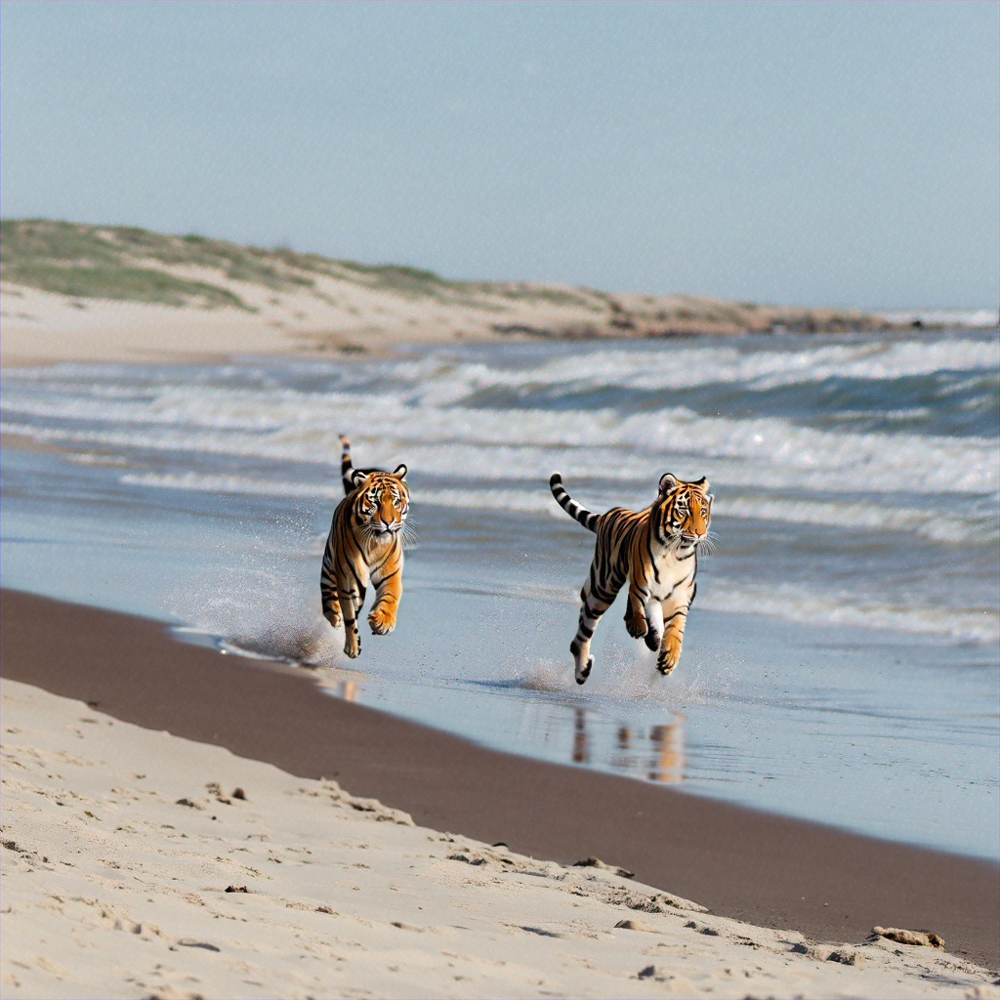

In [169]:
img_stream = io.BytesIO(img)
img = Image.open(img_stream)
img

In [170]:
img.save('tigers_beach.png')

In [172]:
import base64

def generate_image_variation(img_path, instruction_prompt, model_id):
    """
    Shows how to generate variation of an existing image 
    the Amazon Titan Image Generator G1 model (on demand).
    The example uses a mask prompt to specify the area to inpaint.
    Args:
        model_id (str): The model ID to use.
        body (str) : The request body to use.
    Returns:
        image_bytes (bytes): The image generated by the model.
    """

    with open(img_path, "rb") as image_file:
            input_image = base64.b64encode(image_file.read()).decode('utf8')

    body = json.dumps({
            "taskType": "IMAGE_VARIATION",
            "imageVariationParams": {
                "text": instruction_prompt,
                "negativeText": "bad quality, low resolution, cartoon",
                "images": [input_image],
            },
            "imageGenerationConfig": {
                "numberOfImages": 1,
                "height": 1024,
                "width": 1024,
                "cfgScale": 8.0
            }
        })

    accept = "application/json"
    content_type = "application/json"

    response = bedrock_runtime.invoke_model(
        body=body, modelId=model_id, accept=accept, contentType=content_type
    )
    response_body = json.loads(response.get("body").read())
    base64_image = response_body.get("images")[0]
    base64_bytes = base64_image.encode('ascii')
    image_bytes = base64.b64decode(base64_bytes)
    return image_bytes

In [173]:
img_path='./dogs_beach.png'
instruction_prompt='improve resolution of the tigers and the waves on the beach, photo-realistic, 8k, hdr'
model_id='amazon.titan-image-generator-v1'
img = generate_image_variation(img_path, instruction_prompt, model_id)

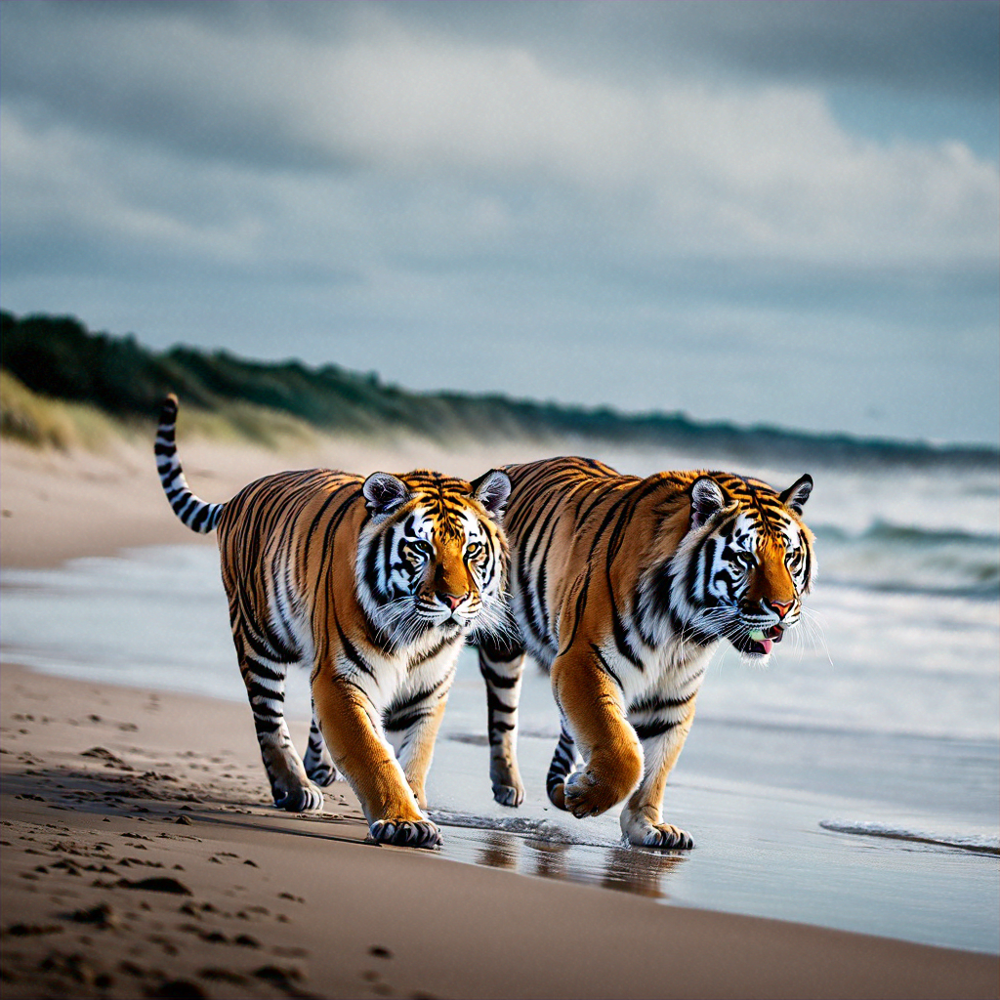

In [174]:
img_stream = io.BytesIO(img)
img = Image.open(img_stream)
img

In [175]:
img.save('tigers_beach_variation.png')

## Mistral AI Models

#### Making Inference Requests

Inference requests to Mistral AI models can be made using `InvokeModel` or `InvokeModelWithResponseStream` (streaming). Details on invoking these models can be found in the AWS documentation:
- [InvokeModel](https://docs.aws.amazon.com/bedrock/latest/APIReference/API_runtime_InvokeModel.html)
- [InvokeModelWithResponseStream](https://docs.aws.amazon.com/bedrock/latest/APIReference/API_runtime_InvokeModelWithResponseStream.html)

You will need the model ID for the model you intend to use. To find the model ID, refer to the [Amazon Bedrock model IDs](https://docs.aws.amazon.com/bedrock/latest/userguide/model-ids.html).

Mistral AI models are licensed under the [Apache 2.0 license](https://www.apache.org/licenses/LICENSE-2.0.txt). For more details on using these models, refer to the [Mistral AI documentation](https://docs.mistral.ai/).

#### Supported Models
- Mistral 7B Instruct
- Mixtral 8X7B Instruct
- Mistral Large

#### Request Parameters

Mistral AI models utilize the following inference parameters:
```json
{
    "prompt": "string",
    "max_tokens": "int",
    "stop": ["string"],
    "temperature": "float",
    "top_p": "float",
    "top_k": "int"
}
```

prompt – (Required) The prompt that you want to pass to the model, as shown in the following example.

```json
<s>[INST] What is your favourite condiment? [/INST]
```

The following example shows how to format is a multi-turn prompt.

```json
<s>[INST] What is your favourite condiment? [/INST]
Well, I'm quite partial to a good squeeze of fresh lemon juice. 
It adds just the right amount of zesty flavour to whatever I'm cooking up in the kitchen!</s> 
[INST] Do you have mayonnaise recipes? [/INST]
```

Text for the user role is inside the `[INST]...[/INST]` tokens, text outside is the assistant role.
The beginning and ending of a string are represented by the `<s>` (beginning of string) and `</s>` (end of string) tokens.
For information about sending a chat prompt in the correct format, see Chat template in the [Mistral AI documentation](https://docs.mistral.ai/models/#chat-template).


#### Response Parameters

The body response from a call to `InvokeModel` contains the following JSON structure:

```json
{
  "outputs": [
    {
      "text": "string",
      "stop_reason": "string"
    }
  ]
}
```

The body response has the following fields:

- **outputs** – A list of outputs from the model. Each output has the following fields:
  - **text** – The text that the model generated.
  - **stop_reason** – The reason why the response stopped generating text. Possible values are:
    - **stop** – The model has finished generating text for the input prompt. The model stops because it has no more content to generate or if the model generates one of the stop sequences that you define in the stop request parameter.
    - **length** – The length of the tokens for the generated text exceeds the value of max_tokens in the call to InvokeModel (InvokeModelWithResponseStream, if you are streaming output). The response is truncated to max_tokens tokens.


### Prompt Mistral Text LLMs 

Let's use the basic `invoke_model(...)`function to do some prompting with the mistral text LLMs

In [176]:
def prompt_mistral_model_text(prompt, model_id):
    mistral_prompt = """<s>[INST] +"""+ prompt + """ [/INST]"""
    body = json.dumps({
            "prompt": mistral_prompt,
            "max_tokens": 4000,
            "temperature": 0,
    })
    accept = "application/json"
    content_type = "application/json"
    response = bedrock_runtime.invoke_model(body=body, modelId=model_id, 
                                            accept=accept, contentType=content_type)
    response_body = json.loads(response.get("body").read())
    return response_body

In [177]:
model_id = 'mistral.mistral-7b-instruct-v0:2'
prompt = """Explain mortgage in detail with pros and cons"""
response = prompt_mistral_model_text(prompt, model_id)

In [178]:
response

{'outputs': [{'text': ' A mortgage is a type of loan that is used to finance the purchase of real estate property. When you take out a mortgage, the lender provides you with the necessary funds to buy a house or other real estate, and you agree to repay the loan amount, plus interest, over a specified period of time. The property you are buying serves as collateral for the loan, which means that if you fail to make your mortgage payments, the lender can foreclose on the property and sell it to recoup their losses.\n\nPros of Getting a Mortgage:\n\n1. Allows Homeownership: A mortgage enables individuals to purchase a property that they may not be able to pay for in cash.\n2. Fixed Interest Rates: Many mortgages offer fixed interest rates, which means that your monthly payments will remain the same for the duration of the loan term.\n3. Tax Deductions: Mortgage interest payments are tax-deductible in many countries, which can help reduce your overall tax liability.\n4. Building Equity: E

In [179]:
print(response['outputs'][0]['text'])

 A mortgage is a type of loan that is used to finance the purchase of real estate property. When you take out a mortgage, the lender provides you with the necessary funds to buy a house or other real estate, and you agree to repay the loan amount, plus interest, over a specified period of time. The property you are buying serves as collateral for the loan, which means that if you fail to make your mortgage payments, the lender can foreclose on the property and sell it to recoup their losses.

Pros of Getting a Mortgage:

1. Allows Homeownership: A mortgage enables individuals to purchase a property that they may not be able to pay for in cash.
2. Fixed Interest Rates: Many mortgages offer fixed interest rates, which means that your monthly payments will remain the same for the duration of the loan term.
3. Tax Deductions: Mortgage interest payments are tax-deductible in many countries, which can help reduce your overall tax liability.
4. Building Equity: Each mortgage payment you make 